In [3]:
# !git clone -b seminar_7 https://github.com/AlekseySpasenov/dl-course.git

fatal: destination path 'dl-course' already exists and is not an empty directory.


In [4]:
%cd dl-course/2023_spring/lecture7

/kaggle/working/dl-course/2023_spring/lecture7


In [5]:
!wget https://data.deepai.org/PascalVOC2012.zip
!unzip PascalVOC2012.zip
!mv voc2012 VOCdevkit

--2023-06-11 13:18:14--  https://data.deepai.org/PascalVOC2012.zip
Resolving data.deepai.org (data.deepai.org)... 195.181.163.196, 2400:52e0:1a02::975:1
Connecting to data.deepai.org (data.deepai.org)|195.181.163.196|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3899239928 (3.6G) [application/zip]
Saving to: ‘PascalVOC2012.zip’

PascalVOC2012.zip   100%[===================>]   3.63G  12.7MB/s    in 7m 39s  

2023-06-11 13:25:53 (8.10 MB/s) - ‘PascalVOC2012.zip’ saved [3899239928/3899239928]

Archive:  PascalVOC2012.zip
  inflating: VOC2012/Annotations/2007_000027.xml  
  inflating: VOC2012/Annotations/2007_000032.xml  
  inflating: VOC2012/Annotations/2007_000033.xml  
  inflating: VOC2012/Annotations/2007_000039.xml  
  inflating: VOC2012/Annotations/2007_000042.xml  
  inflating: VOC2012/Annotations/2007_000061.xml  
  inflating: VOC2012/Annotations/2007_000063.xml  
  inflating: VOC2012/Annotations/2007_000068.xml  
  inflating: VOC2012/Annotations/2007_0

ФИО: Гета Ольга Александровна


Задание:
1.   решаем ту же самую задачу
2.   необходимо дополнить список аугментаций (>= 2)
3.   Добавить понятные метрики на валидацию mean-IoU
4.   Добавить лосс Jaccard или DICE loss к BCE, как показывалось на лекции
5.   Взять непредобученную модель(можно использовать ту, что в лекции или взять другую)
6.   Пообучать модель несколько эпох 
7.   Показать результаты работы - графики mean-IoU, лосс и примеры работы

# GO

In [6]:
!ls

PascalVOC2012.zip  augmentations.py  resources
README.md	   cvmade	     seminar.py
VOC2012		   download.sh	     seminar7-segmentation-full.ipynb
VOCdevkit	   env.yml	     seminar7-segmentation.ipynb


In [7]:
!pip install pytorch_lightning

In [8]:
%matplotlib inline
import random

import cv2
import torch
import torchvision
import numpy as np
import pytorch_lightning as pl
from matplotlib import pyplot as plt
from PIL import Image
from torchvision.datasets import VOCSegmentation
import torch.nn as nn
import torch.nn.functional as F


import cvmade
import seminar

# Реализация аугментаций с соответствующего семинара.
from augmentations import AffineAugmenter, BrightnessContrastAugmenter, BlurAugmenter, FlipAugmenter, RandomAugmentation

print("Torch", torch.__version__)

USE_CUDA = torch.cuda.is_available()
if USE_CUDA:
    DEVICE="cuda"
    print("Use CUDA")
else:
    DEVICE="cpu"
    
# Параметры тренировки и визуализации.
TRAIN = True  # Если False, будут использоваться заранее посчитанные графики
              # вместо реальной тренировки (полезно для демонстрации на ноутбуках без GPU).

def set_figure_size(figsize=(8, 6), dpi=120):
    plt.figure(figsize=figsize, dpi=dpi)

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

Torch 2.0.0
Use CUDA


# Подготовка данных

In [9]:
DATA_ROOT = "."
VOC_YEAR = "2012"
LABELS = ["background", "aeroplane", "bicycle", "bird", "boat", "bottle",
          "bus", "car", "cat", "chair", "cow", "diningtable", "dog", "horse",
          "motorbike", "person", "potted_plant", "sheep", "sofa", "train", "tv/monitor"]
MULTICLASS = False  # Если False, отделяем объекты от фона, иначе распознаем класс объектов.
NUM_CLASSES = len(LABELS) if MULTICLASS else 2
print("Number of classes:", NUM_CLASSES)

Number of classes: 2


Mask values: {0, 7, 14, 15, 255}


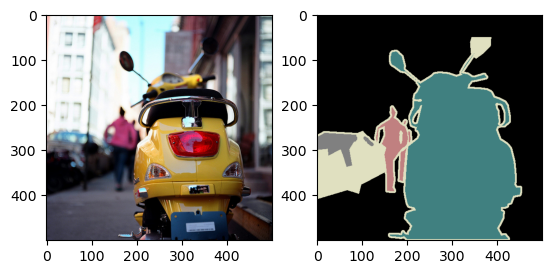

In [10]:
# Посмотрим на валидационную часть корпуса.
valset_raw = VOCSegmentation(DATA_ROOT, VOC_YEAR, "val", download=False)

image, mask = valset_raw[random.randint(0, len(valset_raw) - 1)]
print("Mask values:", set(np.array(mask).flatten().tolist()))

fig, axs = plt.subplots(1, 2)
axs[0].imshow(image)
axs[1].imshow(mask)
plt.show()

### дополнить список аугментаций (>= 2)

Инвертирую цвета и добавляю пиксели

In [11]:
class NegativeAugmenter(object):
    def __call__(self, image, mask):
        image = np.array(image)  
        image = ImageOps.invert(image) 
        image = image.clip(0, 255).astype(np.uint8)
        return image, mask  

In [12]:
class PixelateAugmenter(object):
    def __init__(self, block_size=10):
        self.block_size = block_size

    def __call__(self, image, mask):
        image = np.array(image)  
        h, w, c = image.shape
        image = cv2.resize(image, (w // self.block_size, h // self.block_size), interpolation=cv2.INTER_NEAREST)
        image = cv2.resize(image, (w, h), interpolation=cv2.INTER_NEAREST)
        image = image.clip(0, 255).astype(np.uint8)
        return image, mask  


In [13]:
class Scaler(object):
    """Отмасштабировать изображения сохранив пропорции.
    
    Пустые места будут заполнены отражениями.

    Аргументы:
        image: Изображение в HWC формате.
        size: Требуемый размер, пара W, H.
    """
    def __init__(self, size):
        self._size = size
        self._padding = 0
    
    def set_padding(self, padding):
        self._padding = padding
        
    def __call__(self, image):
        if not isinstance(image, np.ndarray):
            image = np.array(image)
        grayscale = (len(image.shape) == 2)
        if grayscale:
            image = image[..., None]
        rw, rh = self._size
        p = self._padding
        h, w, c = image.shape
        scale_x = rw / w
        scale_y = rh / h
        scale = min(scale_x, scale_y)
        sw = int(scale * w)
        sh = int(scale * h)
        offset_x = p + (rw - sw) // 2
        offset_y = p + (rh - sh) // 2
        # Используем zeros на случай маленьких изображений.
        result = np.zeros((rh + 2 * p, rw + 2 * p, c), dtype=image.dtype)
        cv2.resize(image, (sw, sh),
                   interpolation=cv2.INTER_NEAREST if grayscale else cv2.INTER_AREA,
                   dst=result[offset_y:offset_y + sh, offset_x:offset_x + sw])

        # Отразить.
        result[offset_y:offset_y + sh, :offset_x] = result[offset_y:offset_y + sh, offset_x:2 * offset_x][:, ::-1]
        offset_end = result.shape[1] - offset_x - sw
        result[offset_y:offset_y + sh, offset_x + sw:] = result[offset_y:offset_y + sh, sw + offset_x - offset_end:sw + offset_x][:, ::-1]
        
        result[:offset_y] = result[offset_y:2 * offset_y][::-1]
        offset_end = result.shape[0] - offset_y - sh
        result[offset_y + sh:] = result[sh + offset_y - offset_end:sh + offset_y][::-1]
        
        if grayscale:
            result = result[:, :, 0]
        return result

    
def remove_borders_inplace(mask):
    mask[mask == 255] = 0
    return mask
    

class VOCDataset(torch.utils.data.Dataset):
    """Обертка для стандартного класса, которая форматирует данные."""
    def __init__(self, root, year, image_size,
                 multiclass=MULTICLASS,
                 download=False, augment=False,
                 train=False, train_fraction=0.8,
                 padding=0):
        """Создать корпус.
        
        Аргументы:
            root: Путь до папки для хранения данных.
            year: 2007 или 2012.
            image_size: Ширина и высота изображений.
            download: Скачать корпус, если он не найден в папке.
            augment: Применить аугментации.
            train: Выделить train часть, иначе validation.
            train_fraction: Доля тренировочных примеров.
            padding: Добавить дополнительный зеркальынй паддинг к изображению.
        """
        self._dataset = VOCSegmentation(root, str(year), "trainval", download=download)
        self._image_size = np.array(image_size)
        self._multiclass = multiclass
        self._padding = padding
        
        ids = list(range(len(self._dataset)))
        random.seed(0)
        random.shuffle(ids)
        train_size = int(len(ids) * train_fraction)
        self._indices = ids[:train_size] if train else ids[train_size:]

        self._image_scaler = Scaler(image_size)
        self._mask_scaler = Scaler(image_size)
        if augment:
            self._augmenter = RandomAugmentation(AffineAugmenter(),
                                                 BrightnessContrastAugmenter(),
                                                 BlurAugmenter(),
                                                 FlipAugmenter(),
                                                 NegativeAugmenter(), 
                                                 PixelateAugmenter())     # добавила аугментации
        else:
            self._augmenter = lambda image, mask: (image, mask)
        
    @property
    def image_size(self):
        return self._image_size + self._padding * 2
    
    def set_padding(self, padding):
        self._padding = padding
        self._image_scaler.set_padding(padding)
        self._mask_scaler.set_padding(padding)
        
    def __len__(self):
        return len(self._indices)
    
    def __getitem__(self, idx):
        image, mask = self._dataset[self._indices[idx]]
        image = np.asarray(image)
        mask = np.array(mask)
        remove_borders_inplace(mask)
        if not self._multiclass:
            mask[mask > 0] = 1
        image = self._image_scaler(image)
        mask = self._mask_scaler(mask)
        image, mask = self._augmenter(image, mask)
        image = cvmade.image.image_to_torch(image).float() - 0.5
        mask = cvmade.image.image_to_torch(mask[..., None]).long()[0]
        return image, mask

IMAGE_SIZE = 512  # В исходной статье U-Net применяется к изображениям размера 572.

# Корпус был загружен выше, download = False.
trainset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                      multiclass=MULTICLASS, train=True)
valset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                    multiclass=MULTICLASS, train=False)
print("Image size:", IMAGE_SIZE)
print("Train set size:", len(trainset))
print("Validation set size:", len(valset))

Image size: 512
Train set size: 2330
Validation set size: 583


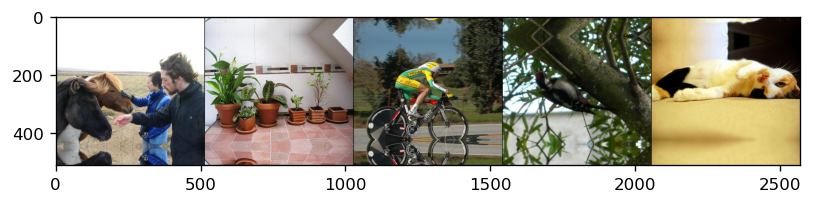

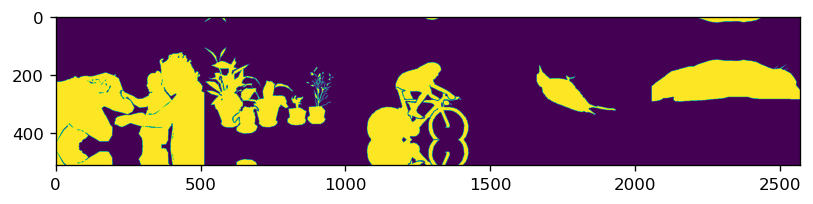

In [14]:
def show_dataset(dataset):
    images = []
    masks = []
    for _ in range(5):
        i = random.randint(0, len(valset) - 1)
        if len(images):
            separator = np.zeros((dataset.image_size[0], 2, 3), dtype=np.uint8)
            images.append(separator)
            masks.append(separator[:, :, 0])
        image, mask = dataset[i]
        images.append(cvmade.image.image_to_numpy(image))
        masks.append(cvmade.image.image_to_numpy(mask[None, ...])[..., 0])

    %matplotlib inline
    set_figure_size()
    plt.imshow(np.concatenate(images, axis=1))
    plt.show()
    set_figure_size()
    plt.imshow(np.concatenate(masks, axis=1))
    plt.show()
    
valset.set_padding(0)
show_dataset(trainset)

### Добавить понятные метрики на валидацию mean-IoU

In [15]:
class IoU(torch.nn.Module):
    def __init__(self):
        super(IoU, self).__init__()

    def forward(self, predict, target, eps=1e-7):
        predict, target = self.crop_images(predict, target)
        b, c, h, w = predict.size()
        predict = torch.sigmoid(predict)
        predict = predict.view(-1)
        target = target.view(-1)

        intersection = torch.sum(predict * target)
        union = torch.sum(predict + target)
        iou = (intersection + eps) / (union - intersection + eps)
        return iou

### Добавить лосс Jaccard или DICE loss к BCE

Добавляю DICE loss

In [16]:
def crop_images(predicted, masks_or_images):
    """Если выход больше или меньше чем исходное изображение,
    вырезать центральную часть из обоих, чтобы размеры совпадали.
    """
    if len(masks_or_images.shape) == 3:
        predicted, masks = crop_images(predicted, masks_or_images.unsqueeze(1))
        return predicted, masks[:, 0]
    images = masks_or_images
    if (len(predicted.shape) != 4) or (len(images.shape) != 4):
        raise ValueError("Expected tensors of shape BCHW")
    bi, ci, hi, wi = images.shape
    bp, cp, hp, wp = predicted.shape
    offset = (abs(hi - hp) // 2, abs(wi - wp) // 2)
    if hp < hi:
        images = images[:, :, offset[0]:offset[0] + hp]
    else:
        predicted = predicted[:, :, offset[0]:offset[0] + hi]
    if wp < wi:
        images = images[:, :, :, offset[1]:offset[1] + wp]
    else:
        predicted = predicted[:, :, :, offset[1]:offset[1] + wi]
    return predicted, images


$\text{Dice_loss} = 1 - \frac{{2|X \cap Y|}}{{|X| + |Y|}}$



In [17]:
class DiceBCE(torch.nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCE, self).__init__()

    def forward(self, predicted, masks, smooth=1):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape

        inputs = torch.sigmoid(predicted)
        inputs = inputs.reshape(-1)
        target = masks.reshape(-1).float()

        intersection = (inputs * target).sum()
        dice = 1 - (2. * intersection + smooth) / (inputs.sum() + target.sum() + smooth)
        BCE = torch.nn.functional.binary_cross_entropy(inputs, target, reduction='mean')
        loss = BCE + dice

        return loss

### Взять непредобученную модель(можно использовать ту, что в лекции или взять другую)

Модель из лекции

In [18]:
def make_conv1x1(in_channels, out_channels):
    """Создать слой свертки 1x1."""
    # Начало вашего кода.
    
    layer = torch.nn.Conv2d(in_channels, out_channels, 1)
    
    # Конец вашего кода.
    
    return layer

def make_transposed_convolution2x2(in_channels, out_channels):
    """Создать транспонированную свертку (AKA deconvolution, upconvolution)."""
    
    # Обратите внимание на параметр output_padding. Поскольку stride в maxpooling
    # может давать один и тот же размер выхода для разных размеров входа, необходимо
    # указать такую добавку к размерности, чтобы получился тензор той же размерности,
    # что и в первой части сети.
    #
    # Поскольку у нас размер изображения всегда четный,
    # output_padding нужно выставить в 0.
    
    # Начало вашего кода.
    
    layer = torch.nn.ConvTranspose2d(in_channels, out_channels, 2, stride=2)
    
    # Конец вашего кода.
    
    return layer

def make_conv3x3(in_channels, out_channels, bias=True):
    return torch.nn.Conv2d(in_channels, out_channels, 3, bias=bias)

def make_batchnorm(channels):
    return torch.nn.BatchNorm2d(channels)

def make_relu():
    return torch.nn.ReLU(inplace=True)

def make_maxpool2x2():
    return torch.nn.MaxPool2d(2)

seminar.check_conv1x1(make_conv1x1)
seminar.check_t_conv(make_transposed_convolution2x2)
seminar.check_ok()

class ConvBlock(torch.nn.Sequential):
    def __init__(self, in_channels, out_channels):
        super().__init__(
            make_conv3x3(in_channels, out_channels, bias=False),
            make_batchnorm(out_channels),
            make_relu(),
            make_conv3x3(out_channels, out_channels, bias=False),
            make_batchnorm(out_channels),
            make_relu()
        )
        
class ResConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.main_path = torch.nn.Sequential(
            make_conv3x3(in_channels, out_channels, bias=False),
            make_batchnorm(out_channels),
            make_relu(),
            make_conv3x3(out_channels, out_channels, bias=False),
            make_batchnorm(out_channels)
        )
        self.residual_path = make_conv1x1(in_channels, out_channels)
        self.last_relu = make_relu()
        
    def forward(self, x):
        result = self.main_path(x)
        residual = self.residual_path(x)[:, :, 2:-2, 2:-2]
        result = self.last_relu(result + residual)
        return result

class UNetDown(torch.nn.Sequential):
    """Часть сети между двумя max pooling, которая начинается с max pooling."""
    def __init__(self, in_channels, out_channels, block):
        layers = [
            make_maxpool2x2(),
            block(in_channels, out_channels)
        ]
        super().__init__(*layers)
     
    
class UNetUp(torch.nn.Module):
    """Часть сети между двумя транспонированными свертками, которая начинается с
    транспонированной свертки."""
    def __init__(self, in_channels, out_channels, block):
        super().__init__()
        self._transposed_convolution = make_transposed_convolution2x2(in_channels, out_channels)
        self._convolutions = block(out_channels * 2, out_channels)
    
    def forward(self, x_down, x_up):
        x_up = self._transposed_convolution(x_up)
        
        b_down, c_down, h_down, w_down = x_down.shape
        b_up, c_up, h_up, w_up = x_up.shape
        if (h_up > h_down) or (w_up > w_down):
            raise ValueError("Up tensor must be smaller than down tensor")
        offset = ((h_down - h_up) // 2, (w_down - w_up) // 2)
        x_down_cropped = x_down[:, :, offset[0]:offset[0] + h_up, offset[1]:offset[1] + w_up]
        
        x = torch.cat((x_down_cropped, x_up), axis=1)
        result = self._convolutions(x)
        return result


class UNet(torch.nn.Module):
    def __init__(self, num_classes, num_scales=4, base_filters=64, block=ConvBlock):
        """Создать U-Net сеть.
        
        Параметры:
            num_classes: Число классов на выходе. Для классификации объект/фон нужно два класса.
            num_scales: Число блоков U-Net сети, выполняющих изменение размера изображения.
            base_filters: Число фильтров на первом уровне сети.
        """
        super().__init__()
        self._input_convolutions = block(3, base_filters)
        
        layers = []
        filters = base_filters
        for i in range(num_scales):
            layers.append(UNetDown(filters, filters * 2, block))
            filters *= 2
        self._down_layers = torch.nn.Sequential(*layers)
        
        layers = []
        for i in range(num_scales):
            layers.append(UNetUp(filters, filters // 2, block))
            filters //= 2
        self._up_layers = torch.nn.Sequential(*layers)
        
        self._output_convolution = make_conv1x1(filters, num_classes)
        self.initialize_weights()

        # Оценим насколько сеть уменьшает изображение.
        self.eval()
        sample_input = torch.zeros((1, 3, 1000, 1000))
        if USE_CUDA:
            sample_input = sample_input.cuda()
            self.cuda()
        with torch.no_grad():
            sample_output = self(sample_input)
        self.padding = (sample_input.shape[-1] - sample_output.shape[-1]) // 2
        
    def forward(self, x):
        down_results = [self._input_convolutions(x)]
        for layer in self._down_layers:
            down_results.append(layer(down_results[-1]))
        x = down_results[-1]
        for i, layer in enumerate(self._up_layers):
            x = layer(down_results[-2 - i], x)
        x = self._output_convolution(x)
        return x
     
    def initialize_weights(self):
        for m in self.modules():
            if isinstance(m, (torch.nn.Conv2d, torch.nn.ConvTranspose2d)):
                torch.nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
                if m.bias is not None:
                    torch.nn.init.constant_(m.bias, 0)
            elif isinstance(m, torch.nn.BatchNorm2d):
                torch.nn.init.constant_(m.weight, 1)
                torch.nn.init.constant_(m.bias, 0)
        
def count_parameters(model):
    total = 0
    for p in model.parameters():
        total += np.prod(list(p.shape))
    return total

USE_RESIDUALS = True

unet = UNet(NUM_CLASSES if NUM_CLASSES > 2 else 1,
            num_scales=4,  # Число блоков U-Net сети, в статье 4.
            base_filters=64,  # Размер свертки на первом уровне, в статье 64.
            block=ResConvBlock if USE_RESIDUALS else ConvBlock)

print("Required padding: {}".format(unet.padding))
print("Total parameters: {}".format(count_parameters(unet)))


CHECK OK
Required padding: 98
Total parameters: 32433409


### Пообучать модель несколько эпох

In [19]:
def make_optimizer(model):
    return torch.optim.Adam(model.parameters(), lr=1e-4)

In [20]:
loss_fn = DiceBCE

model_unet  = seminar.Module(unet, loss_fn, make_optimizer, trainset, valset,
                        lr_scheduler_fn=lambda opt: None,
                        batch_size=4)

In [29]:
trainer = pl.Trainer(accelerator='gpu',devices = 'auto', max_epochs=5, val_check_interval=30)

In [30]:
trainer.fit(model = model_unet)

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

### Показать результаты работы - графики mean-IoU, лосс и примеры работы

In [31]:
def show_segmentations(model, dataset, n=5):
    model.eval()
    if USE_CUDA:
        model.cuda()
    for _ in range(n):
        image, mask_gt = dataset[random.randint(0, len(dataset) - 1)]
        if USE_CUDA:
            image = image.cuda()
            mask_gt = mask_gt.cuda()
        with torch.no_grad():
            predicted = model(image.unsqueeze(0))[0]  # CHW.
            predicted, image = crop_images(predicted.unsqueeze(0), image.unsqueeze(0))
            predicted, image = predicted[0], image[0]
            c = predicted.shape[0]
            if c == 1:
                predicted = torch.nn.functional.logsigmoid(predicted)
                aggregated = predicted[0]
                predicted_labels = predicted[0] > np.log(0.5)
            else:
                predicted = torch.nn.functional.log_softmax(predicted, 0)
                aggregated = torch.logsumexp(predicted[1:], axis=0)
                predicted_labels = predicted.max(0)[1]
        aggregated = aggregated.cpu().numpy()
        predicted_labels = predicted_labels.cpu().numpy().astype(np.uint8)
        image = cvmade.image.image_to_numpy(image)
        mask = (predicted_labels > 0)[..., None]
        selected = image * mask + 255 * (1 - mask)

        %matplotlib inline
        if c != 1:
            print("Classes:", [LABELS[i] for i in set(predicted_labels.flatten().tolist())])
        set_figure_size()
        fig, axs = plt.subplots(1, 4, figsize=(12, 6))
        axs[0].imshow(image)
        axs[1].imshow(predicted_labels)
        axs[2].imshow(aggregated)
        axs[3].imshow(selected)
        plt.show()

In [32]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [33]:
%reload_ext tensorboard

In [34]:
%tensorboard --logdir lightning_logs

Reusing TensorBoard on port 6006 (pid 620), started 0:48:57 ago. (Use '!kill 620' to kill it.)

Trainset


<Figure size 960x720 with 0 Axes>

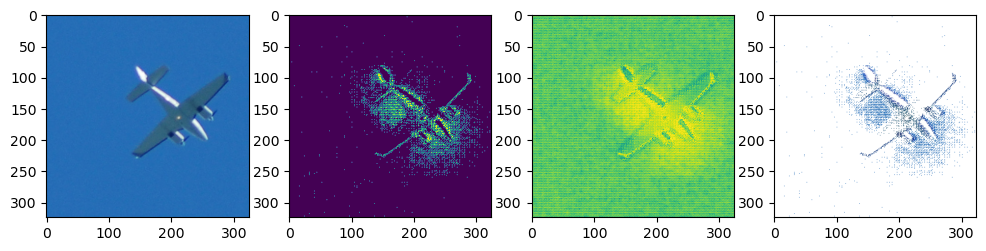

<Figure size 960x720 with 0 Axes>

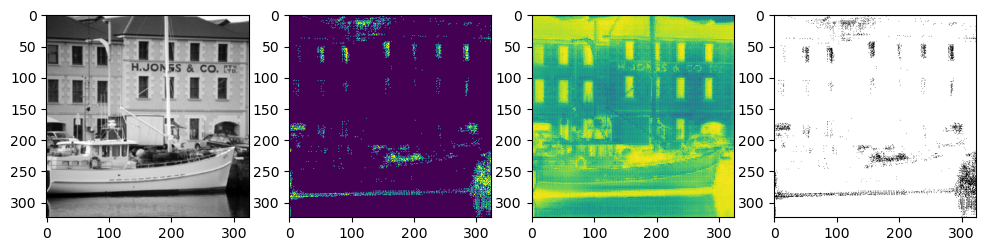

<Figure size 960x720 with 0 Axes>

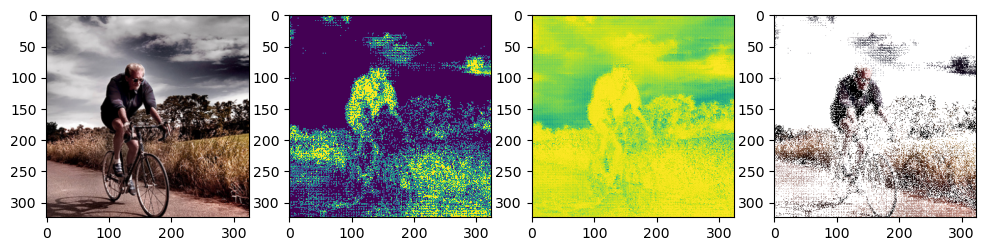

<Figure size 960x720 with 0 Axes>

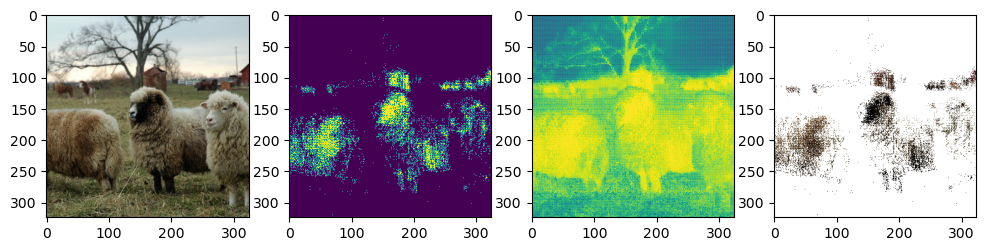

<Figure size 960x720 with 0 Axes>

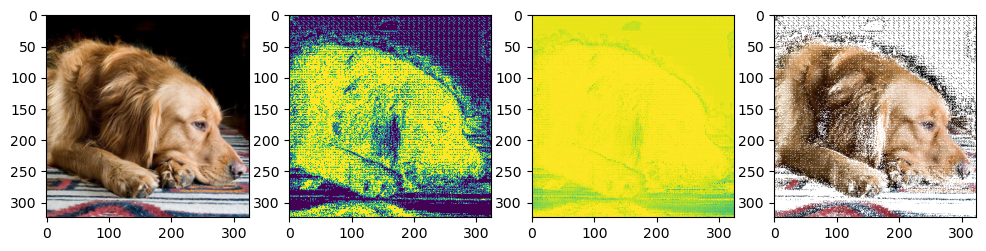

In [35]:
print("Trainset")
show_segmentations(model_unet, trainset)

Valset


<Figure size 960x720 with 0 Axes>

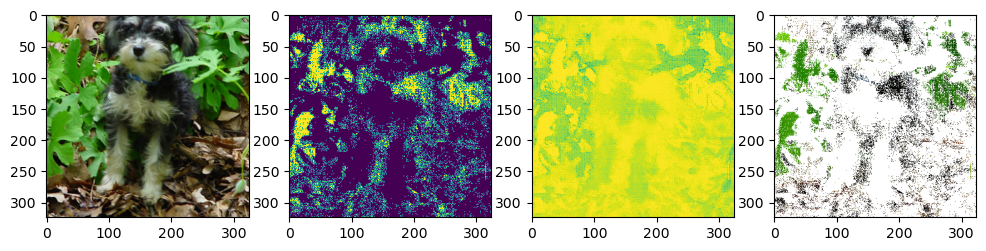

<Figure size 960x720 with 0 Axes>

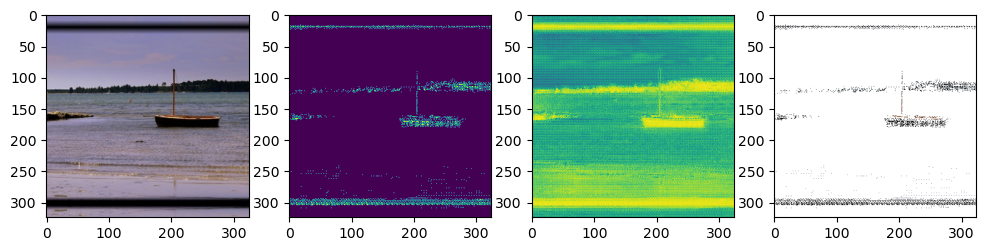

<Figure size 960x720 with 0 Axes>

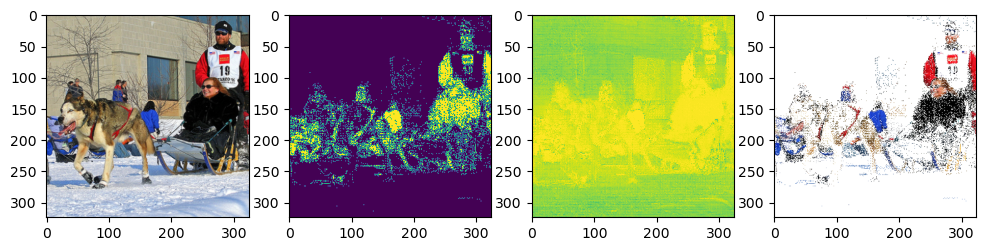

<Figure size 960x720 with 0 Axes>

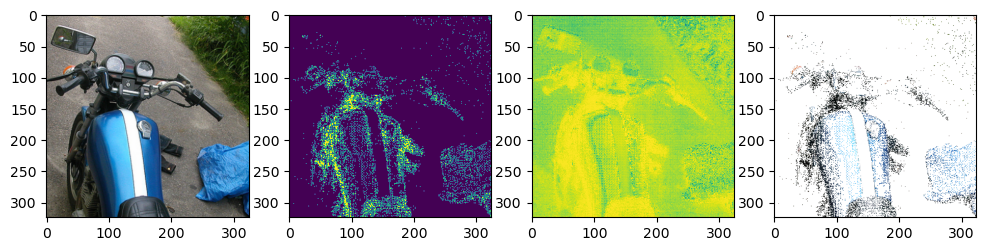

<Figure size 960x720 with 0 Axes>

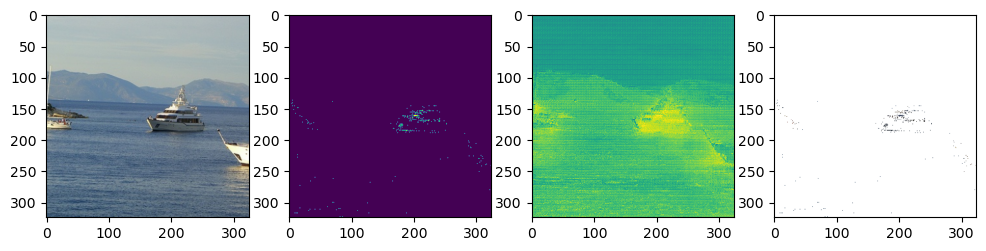

In [36]:
print("Valset")
show_segmentations(model_unet, valset)